#PRiR lab 13 NTS (dodatek)
##Daniel Matusiewicz
##nr 82655

##Zadanie
###Poeksperymentuj z algorytmem Neural Style Transfer (NTS) opisanym w następującej pracy
###Leon A. Gatys, Alexander S. Ecker, Matthias Bethge
###A Neural Algorithm of Artistic Style
###https://arxiv.org/abs/1508.06576
###na podstawie następującego kodu
###https://keras.io/examples/generative/neural_style_transfer/
###lub innego jednego z ponad 3 tysięcy z githuba
###https://github.com/search?p=2&q=neural_style_transfer&type=Repositories
###w szczególności:
- poeksperymentuj z obrazkami wejściowymi (content) i (style)
- wpływem wyboru warstw sieci VGG-19 na wyniki przetwarzania
- opisz wykonaną pracę nad implementacją i rozwinięciem kodów oraz wyniki w postaci
sprawozdania umieszczonego np. na github.com


##Wykorzystałem kod z linku nr 2, a mianowicie: https://keras.io/examples/generative/neural_style_transfer/
## Głównie skupiłem się na sprawdzeniu efetków zmiany stylu oraz liczby iteracji.

In [106]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19

base_image_path = keras.utils.get_file("qwe.jpg", "https://ocdn.eu/pulscms-transforms/1/T3lktkpTURBXy8zZWYyMWRhMDIwY2FkNGIyOTczOTA3MDFiOTg3ZDBlZi5qcGeRlQMAHc0HM80EDA")
style_reference_image_path = keras.utils.get_file(
    "asd3.jpg", "https://i.ibb.co/QnMJ00m/fuzja.jpg"
)
result_prefix = "never gonna give you up!"

# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

# Dimensions of the generated picture.
width, height = keras.preprocessing.image.load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

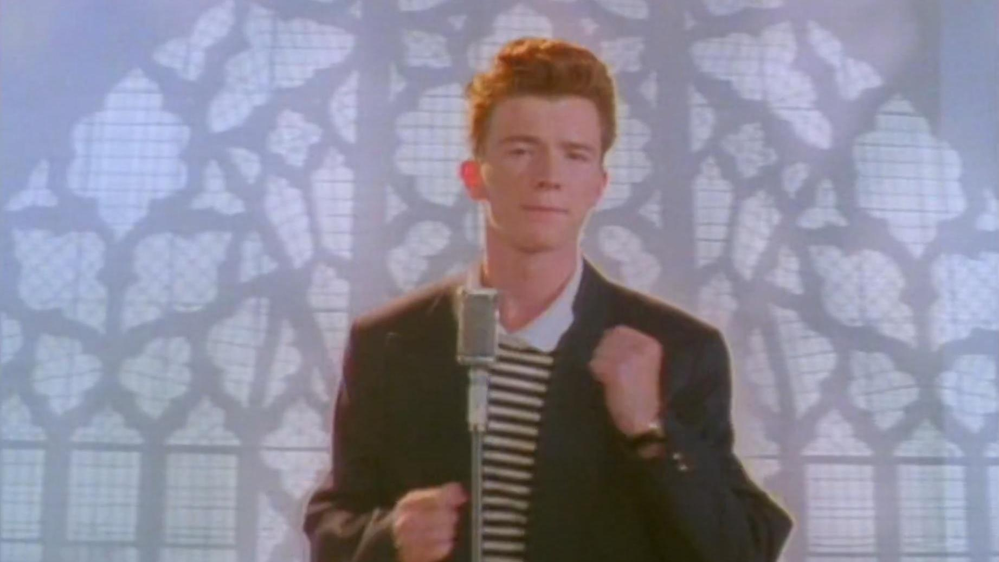

In [107]:
from IPython.display import Image, display

display(Image(base_image_path))

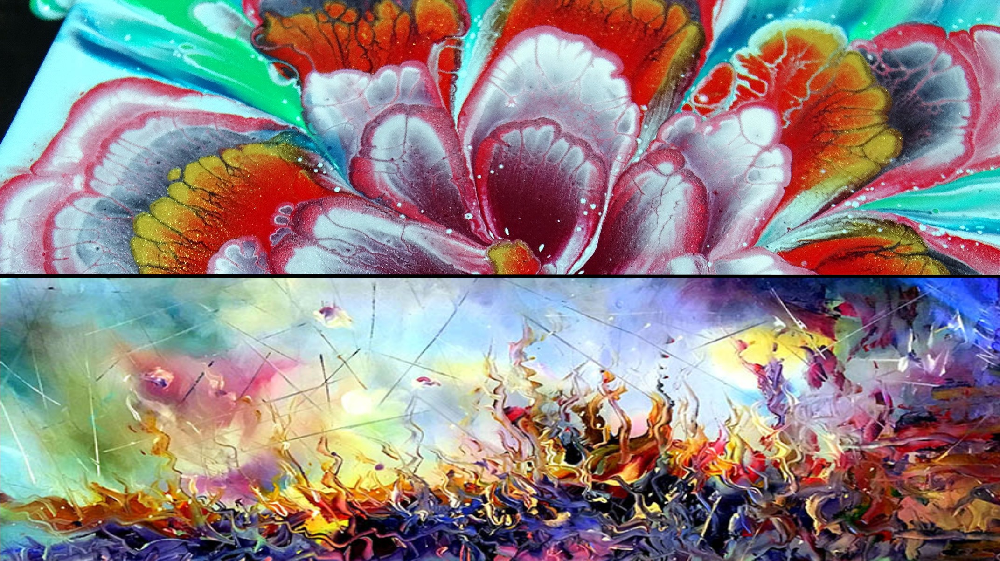

In [108]:
display(Image(style_reference_image_path))

In [109]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.preprocessing.image.load_img(
        image_path, target_size=(img_nrows, img_ncols)
    )
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

# The gram matrix of an image tensor (feature-wise outer product)


def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels**2) * (size**2))


# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))

In [110]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

In [111]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [112]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads


In [113]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

iterations = 2000
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_iteration_%d.png" % i
        keras.preprocessing.image.save_img(fname, img)

Iteration 100: loss=6093.42
Iteration 200: loss=4709.83
Iteration 300: loss=4135.85
Iteration 400: loss=3812.22
Iteration 500: loss=3600.98
Iteration 600: loss=3450.34
Iteration 700: loss=3336.23
Iteration 800: loss=3246.51
Iteration 900: loss=3173.99
Iteration 1000: loss=3114.03
Iteration 1100: loss=3063.58
Iteration 1200: loss=3020.20
Iteration 1300: loss=2982.61
Iteration 1400: loss=2949.73
Iteration 1500: loss=2920.80
Iteration 1600: loss=2895.12
Iteration 1700: loss=2872.07
Iteration 1800: loss=2851.34
Iteration 1900: loss=2832.63
Iteration 2000: loss=2815.63


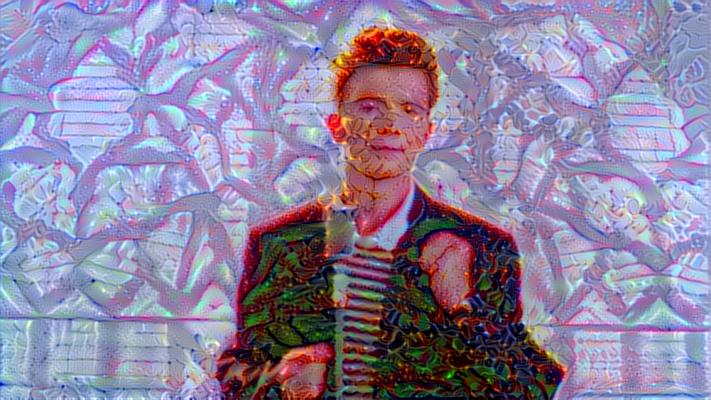

In [114]:
display(Image(result_prefix + "_at_iteration_2000.png"))

##Zdjęcie stylu

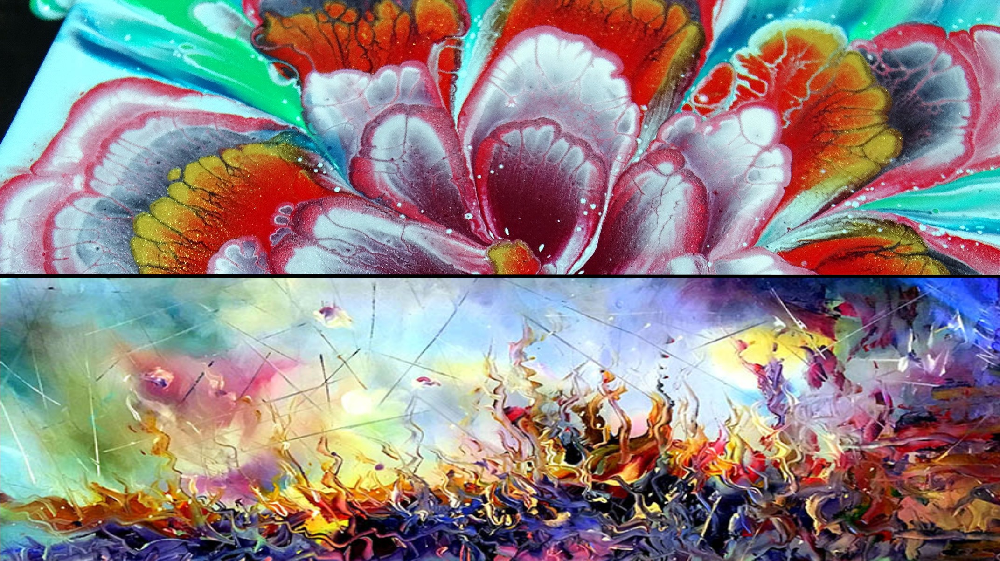

##Wynik przy 2000 iteracji

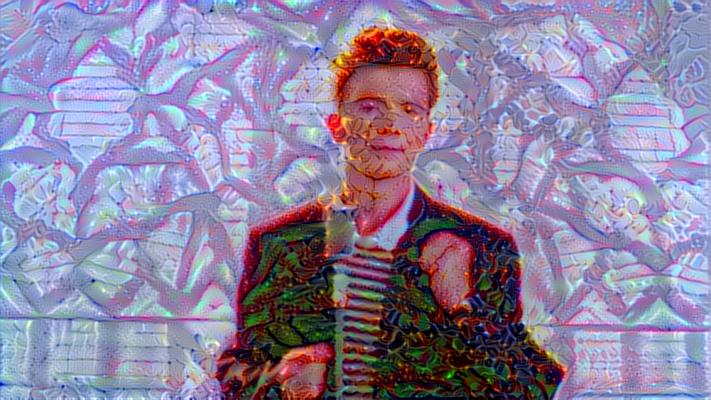

##Wynik przy 800 iteracjach

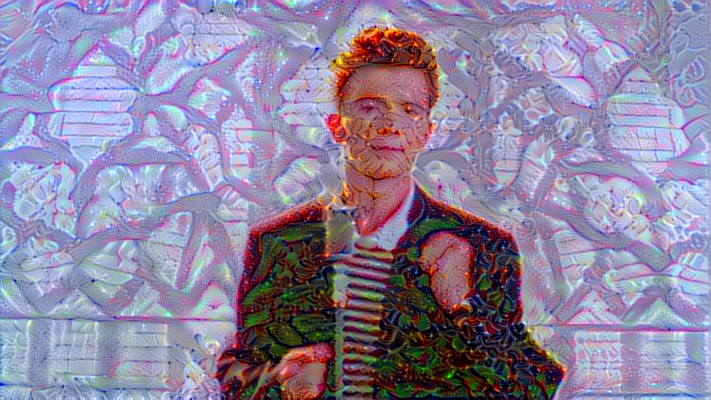

##800 iteracji

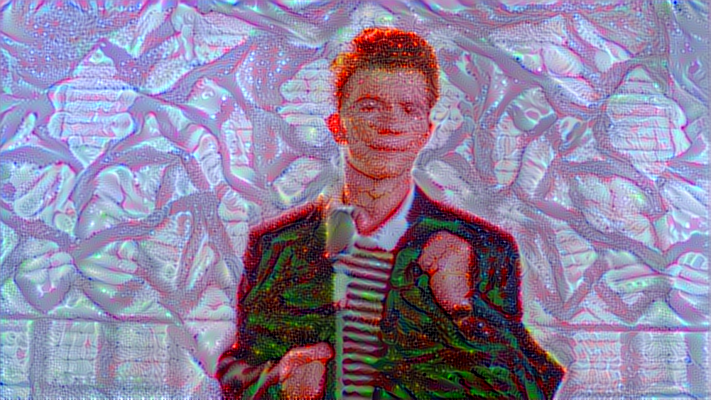

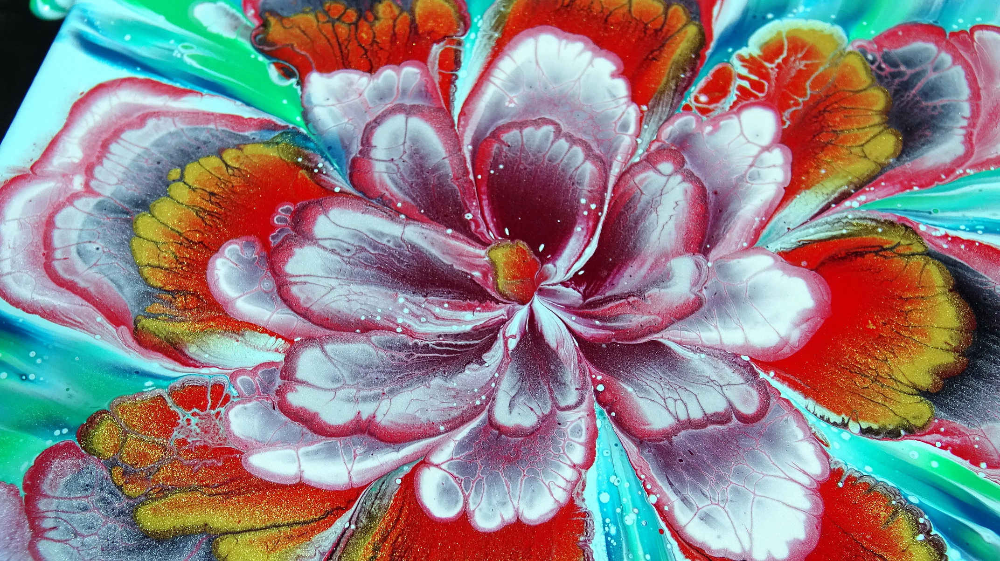

##800 iteracji

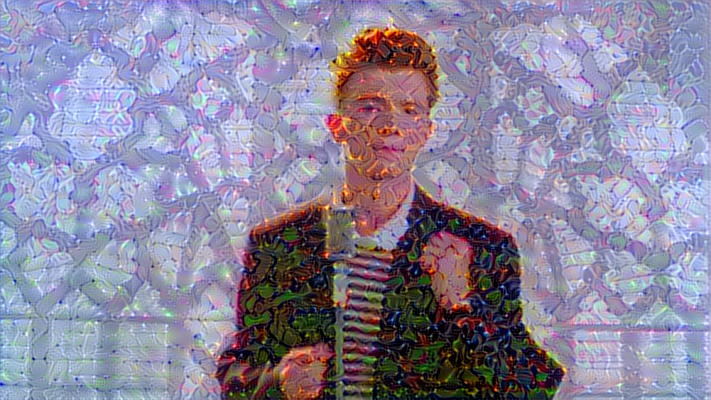

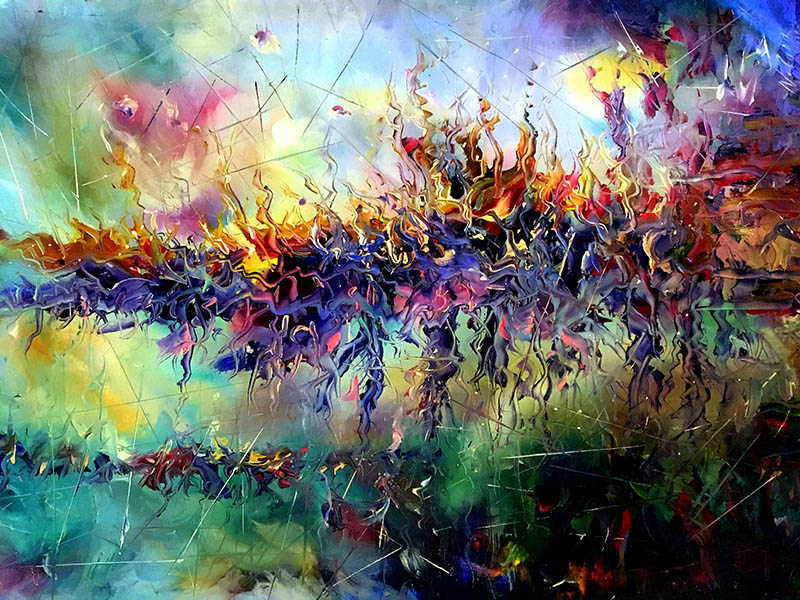

#Podsumowanie
###Próbowałem pokazać wyniki przy dwóch różnych stylach i ich połączeniu. Efekt nie okazał się tak dobry, jak się spodziewałem. Mogłem użyc innych obrazów oraz innej podstawy, może jakiegoś pejzażu.
###Różnica pomiędzy 800, a 2000 iteracjami jest znikoma przy powyższym doborze ilustracji.